# IF3170 Artificial Intelligence | Tugas Besar 2

This notebook serves as a template for the assignment. Please create a copy of this notebook to complete your work. You can add more code blocks, markdown blocks, or new sections if needed.


Group Number: 27

Group Members:
- Ignatius Jhon Hezkiel Chan (13522029)
- Matthew Vladimir Hutabarat (13522093)
- Suthasoma Mahardhika Munthe (13522098)
- Marvin Scifo Yehezkiel Hutahaean (13522110)

## Import Libraries

In [33]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as ss
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, LabelEncoder, RobustScaler, MinMaxScaler
from sklearn.impute import KNNImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import log_loss, accuracy_score, precision_score, recall_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
# Import other libraries if needed

## Import Dataset

In [34]:
# Example of reading a csv file from a gdrive link

# https://drive.google.com/file/d/1oKrpeSBePBCxPF3wsW_cvPSsh62_wmb-/view?usp=drive_link
# https://drive.google.com/file/d/1TL_cESTUZ_ix1MBfMgNmmjn2X2qzrv6F/view?usp=drive_link
# https://drive.google.com/uc?id={file_id}

df = pd.read_csv('dataset_train.csv')
df = df.drop(columns=["label"])
df_test = pd.read_csv('dataset_test.csv')
df.head()
df_test.head()

,id,proto,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,...,ct_flw_http_mthd,is_ftp_login,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm
0,0,tcp,FIN,0.454980,534.0,268.0,254.0,252.0,2.0,1.0,...,0.0,0.0,0.0,5.0,5.0,2.0,2.0,2.0,1.0,2.0
1,1,tcp,FIN,0.648037,8854.0,268.0,254.0,252.0,4.0,1.0,...,0.0,NaN,0.0,6.0,6.0,1.0,1.0,1.0,1.0,5.0
2,2,tcp,FIN,1.120856,3440.0,642.0,254.0,252.0,5.0,3.0,...,0.0,0.0,0.0,4.0,4.0,1.0,2.0,1.0,1.0,4.0
3,3,udp,INT,0.000001,244.0,0.0,254.0,NaN,0.0,0.0,...,0.0,0.0,0.0,10.0,4.0,2.0,4.0,2.0,1.0,4.0
4,4,tcp,FIN,0.264763,1540.0,1644.0,31.0,29.0,4.0,4.0,...,NaN,0.0,0.0,13.0,11.0,10.0,7.0,6.0,1.0,7.0


# Exploratory Data Analysis (Optional)

Exploratory Data Analysis (EDA) is a crucial step in the data analysis process that involves examining and visualizing data sets to uncover patterns, trends, anomalies, and insights. It is the first step before applying more advanced statistical and machine learning techniques. EDA helps you to gain a deep understanding of the data you are working with, allowing you to make informed decisions and formulate hypotheses for further analysis.

In [35]:
categorical_features = ['proto', 'state', 'service','is_sm_ips_ports','is_ftp_login','attack_cat']
noncategorical_features = [col for col in df.columns.tolist() if col not in categorical_features]

In [36]:
def analyze_dataset(df, name):
    size_instances_features = df.shape
    size_bytes = df.memory_usage(deep=True).sum()
    size_kb = size_bytes / 1024

    categorical_features_unique = df[categorical_features].nunique()
    categorical_values = {col: df[col].unique().tolist() for col in categorical_features}

    # Get descriptive statistics for numerical columns
    numerical_features_unique = df[noncategorical_features].describe().loc[["min", "max", "mean", "50%", "std"]]
    numerical_features_unique.rename(index={"50%": "median"}, inplace=True)

    data_types = df.dtypes

    possible_categorical = df.select_dtypes(include=['number']).apply(lambda col: len(col.unique()) < 10)
    return {
        "Dataset": name,
        "Size (Instances, Features)": size_instances_features,
        "Size in Bytes": size_bytes,
        "Size in KB": size_kb,
        "Data Types": data_types,
        "Categorical Feature Unique Values": categorical_features_unique,
        "Categorical Feature Values": categorical_values,
        "Numerical Feature Statistics": numerical_features_unique,
        "Possible Categorical Features (Numerical)": possible_categorical[possible_categorical].index.tolist()
    }

merged_analysis = analyze_dataset(df, "Train dataset")

def print_analysis(result):
    print(f"Dataset: {result['Dataset']}")
    print(f"Size (Instances, Features): {result['Size (Instances, Features)']}")
    print(f"Size in KB: {result['Size in KB']:.2f} KB")
    print("\nData Types:")
    print(result['Data Types'])
    print("\nCategorical Feature Unique Values:\n",result["Categorical Feature Unique Values"])
    print("\nCategorical Feature Values:")
    for feature, values in result["Categorical Feature Values"].items():
        print(f"  - {feature}:\n    ",end="")
        for value in values:
            print(f"{value}",end=",")
        print()
    print("\nValue counts for categorical features: \n")
    for col in categorical_features:
      print(f"Value counts for {col}:")
      print(df[col].value_counts())
      print("-" * 20)
    print("\nNumerical Feature Statistics:")
    print(result['Numerical Feature Statistics'])

print_analysis(merged_analysis)

Dataset: Train dataset
Size (Instances, Features): (175341, 43)
Size in KB: 89119.82 KB

Data Types:
id                     int64
proto                 object
state                 object
dur                  float64
sbytes               float64
dbytes               float64
sttl                 float64
dttl                 float64
sloss                float64
dloss                float64
service               object
sload                float64
dload                float64
spkts                float64
dpkts                float64
swin                 float64
dwin                 float64
stcpb                float64
dtcpb                float64
smean                float64
dmean                float64
trans_depth          float64
response_body_len    float64
sjit                 float64
djit                 float64
sinpkt               float64
dinpkt               float64
tcprtt               float64
synack               float64
ackdat               float64
is_sm_ips_ports      float64


#### Missing Values

In [37]:
missing_values_count = df.isnull().sum()
missing_values_count

id                      0
proto                8826
state                8805
dur                  8722
sbytes               8561
dbytes               8869
sttl                 8825
dttl                 8654
sloss                8794
dloss                8978
service              8791
sload                8786
dload                8837
spkts                8654
dpkts                8686
swin                 8740
dwin                 8779
stcpb                8672
dtcpb                8803
smean                8788
dmean                8855
trans_depth          8785
response_body_len    8791
sjit                 8738
djit                 8846
sinpkt               8707
dinpkt               8734
tcprtt               8836
synack               8736
ackdat               8595
is_sm_ips_ports      8746
ct_state_ttl         8635
ct_flw_http_mthd     8647
is_ftp_login         8647
ct_ftp_cmd           8842
ct_srv_src           8851
ct_srv_dst           8774
ct_dst_ltm           8738
ct_src_ltm  

#### Outliers

In [38]:
def detect_outliers_iqr(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    return outliers

for col in noncategorical_features:
    outliers = detect_outliers_iqr(df[col])
    print(f"Feature: {col}")
    print(f"Outliers:\n{outliers}")
    print(f"Number of outliers: {len(outliers)}")
    print("-" * 20)

Feature: id
Outliers:
Series([], Name: id, dtype: int64)
Number of outliers: 0
--------------------
Feature: dur
Outliers:
0          2.736664
2          5.788526
3          3.849634
20         1.886326
31         3.055214
            ...    
175285     3.637924
175288     2.255197
175323    14.394926
175330    10.135029
175337     4.449357
Name: dur, Length: 14968, dtype: float64
Number of outliers: 14968
--------------------
Feature: sbytes
Outliers:
0          13350.0
2           6102.0
3          25160.0
7          28660.0
16         20964.0
            ...   
175301     14926.0
175314      6830.0
175323     37358.0
175324      7681.0
175330    922724.0
Name: sbytes, Length: 21760, dtype: float64
Number of outliers: 21760
--------------------
Feature: dbytes
Outliers:
0         548216.0
2           3892.0
8           3380.0
9          33044.0
17          4216.0
            ...   
175300     32642.0
175303      6144.0
175306     38858.0
175323      3276.0
175330      6568.0
Name: db

####Box Plot Distribution

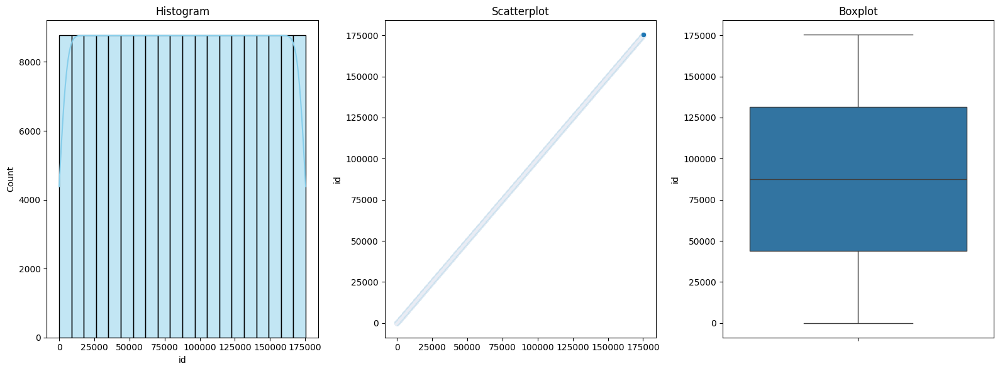

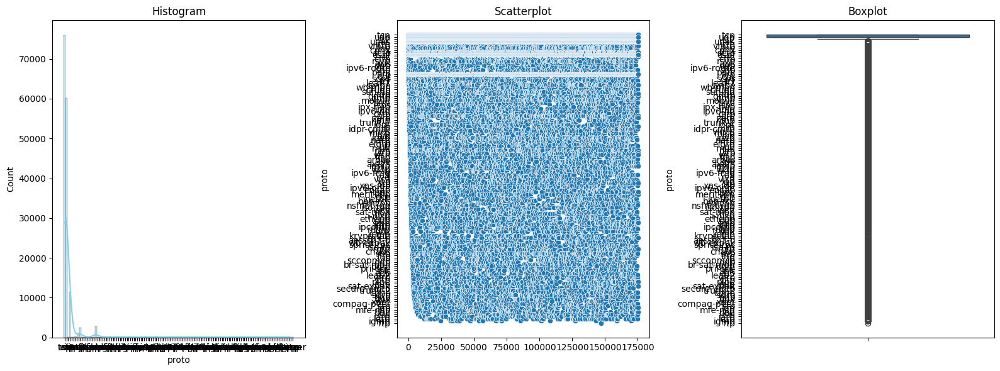

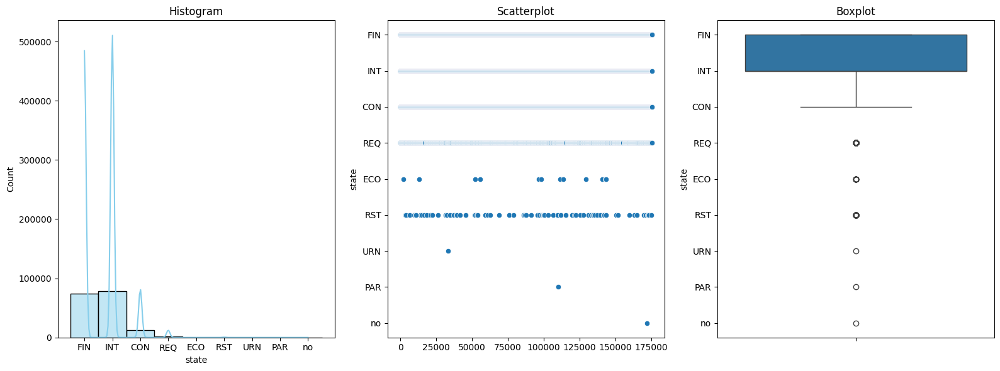

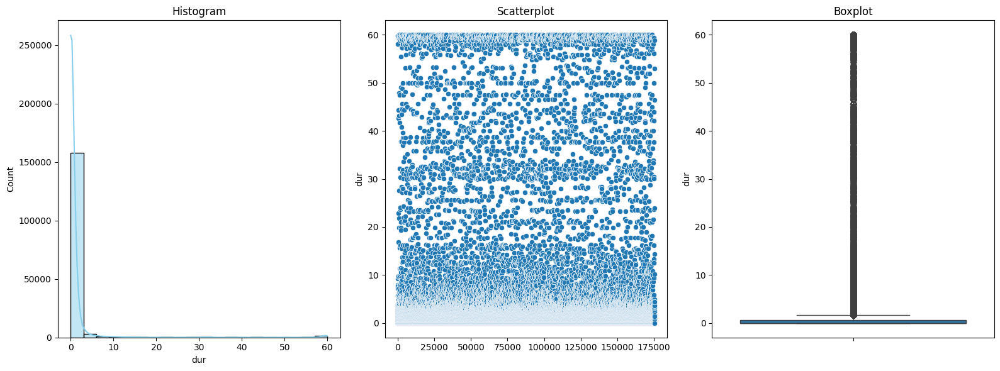

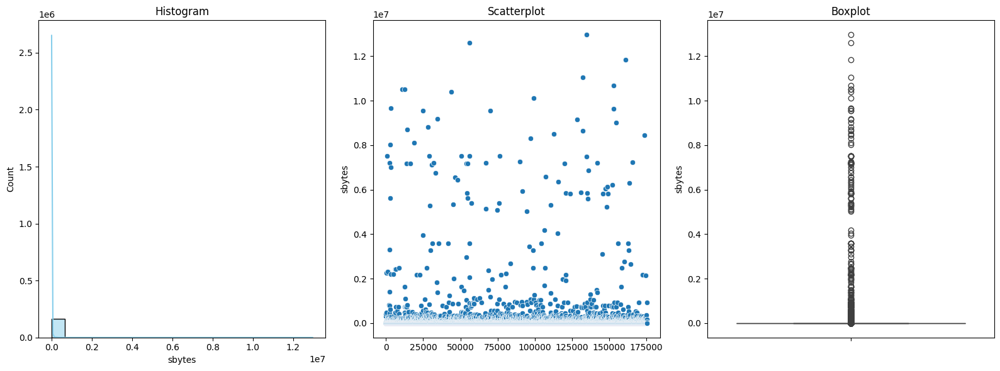

...

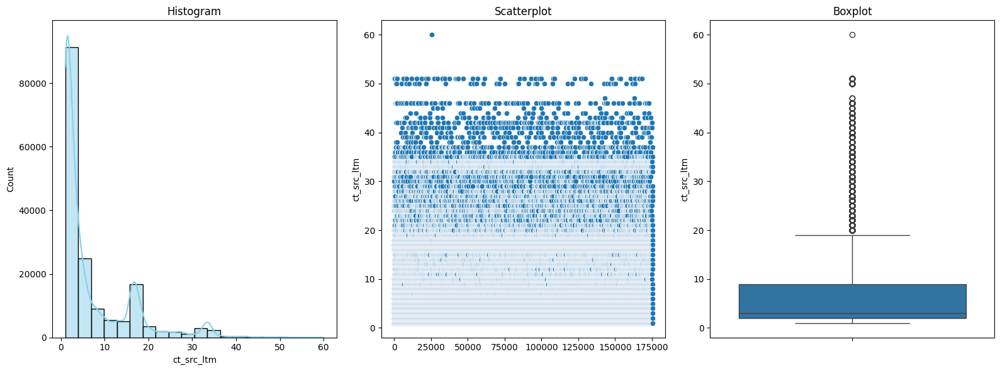

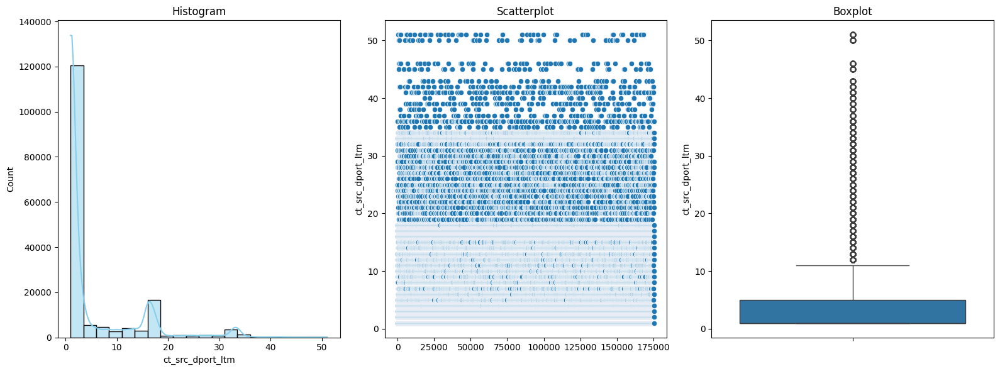

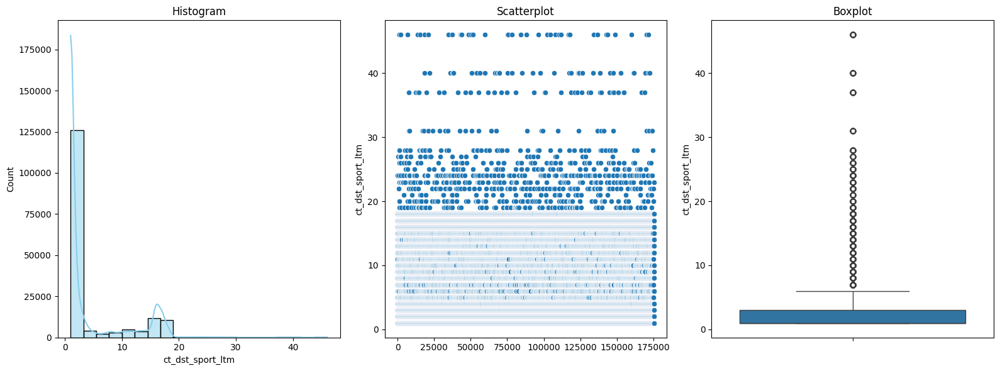

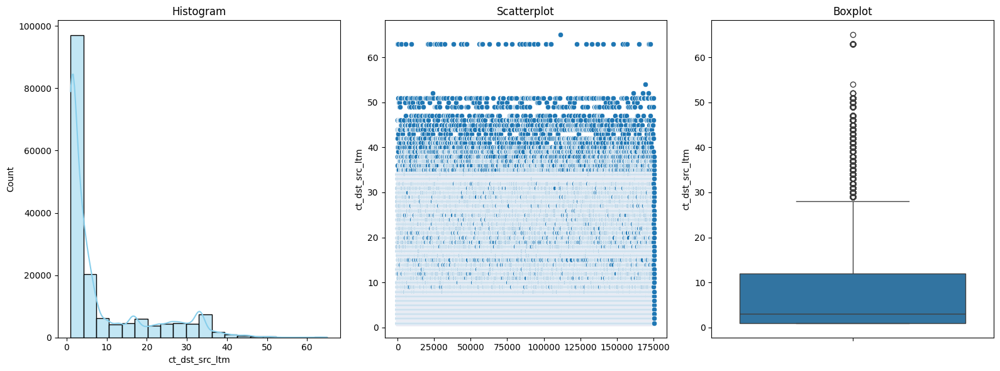

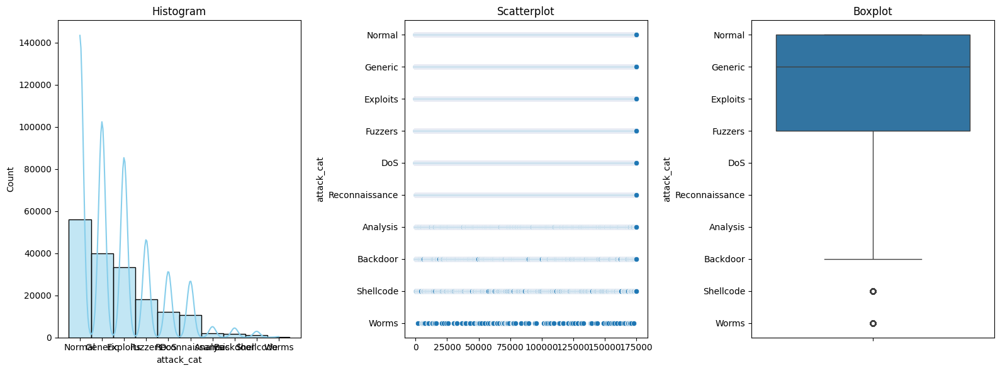

In [39]:
def visualize_data(df):
  for col in df:
    plt.figure(figsize=(16, 6))

    plt.subplot(1, 3, 1)
    sns.histplot(df[col], bins=20, kde=True, color='skyblue')
    plt.title('Histogram')

    plt.subplot(1, 3, 2)
    sns.scatterplot(df[col])
    plt.title("Scatterplot")

    plt.subplot(1, 3, 3)
    sns.boxplot(df[col])
    plt.title("Boxplot")

    plt.tight_layout()
    plt.show()

visualize_data(df)

## Correlation to attack_cat

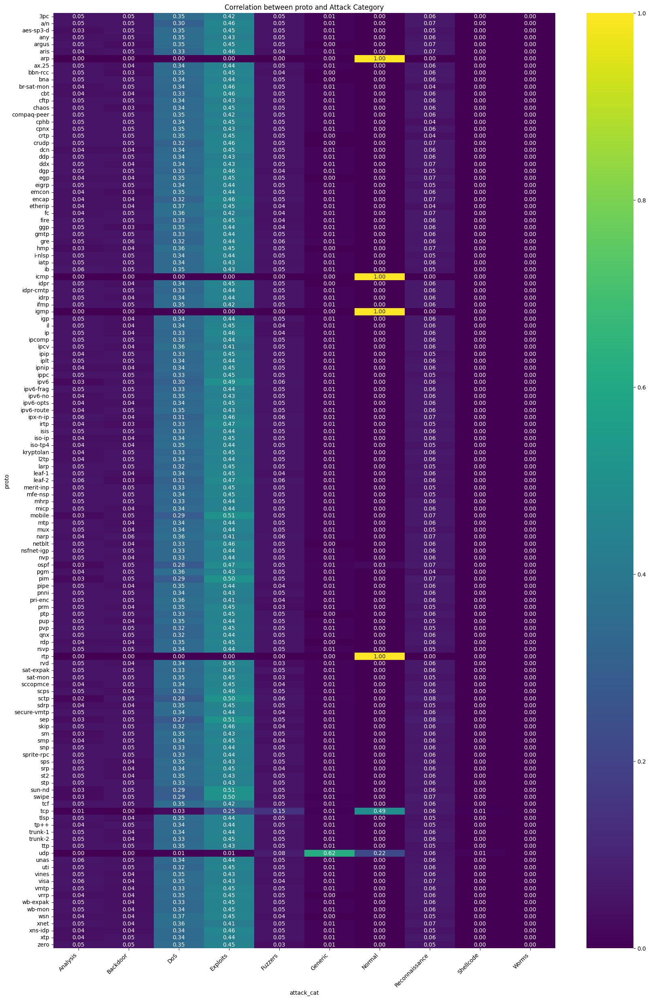

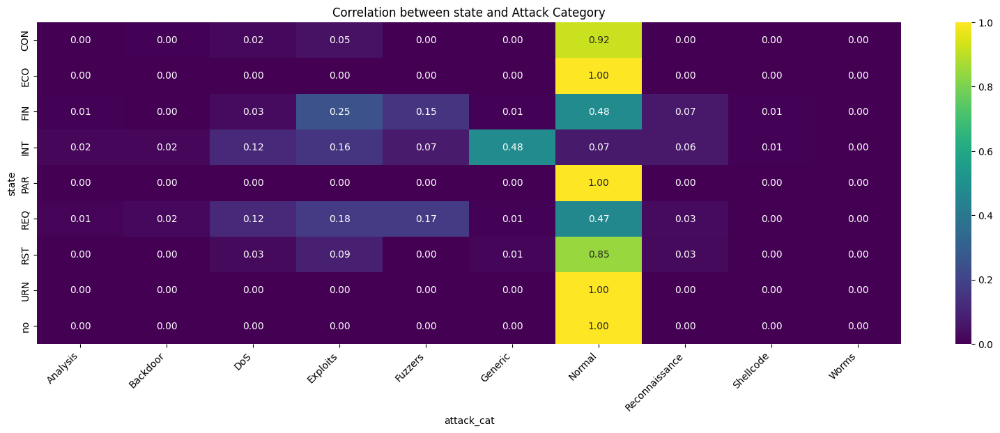

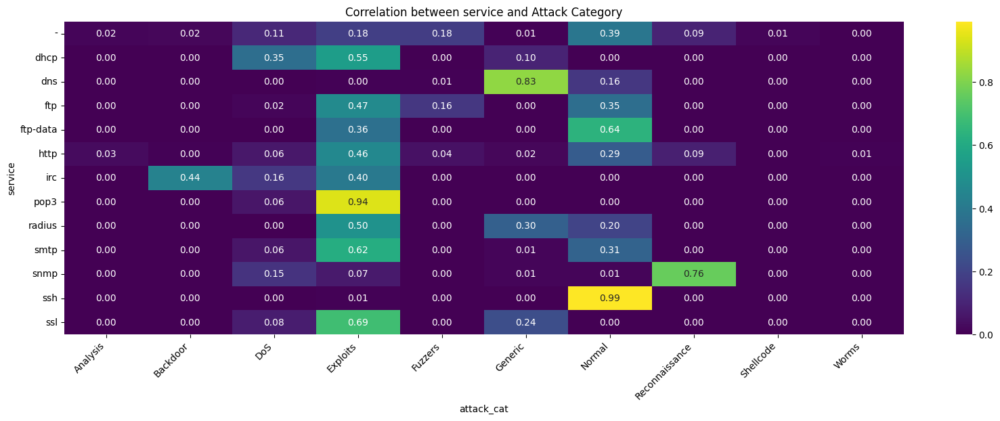

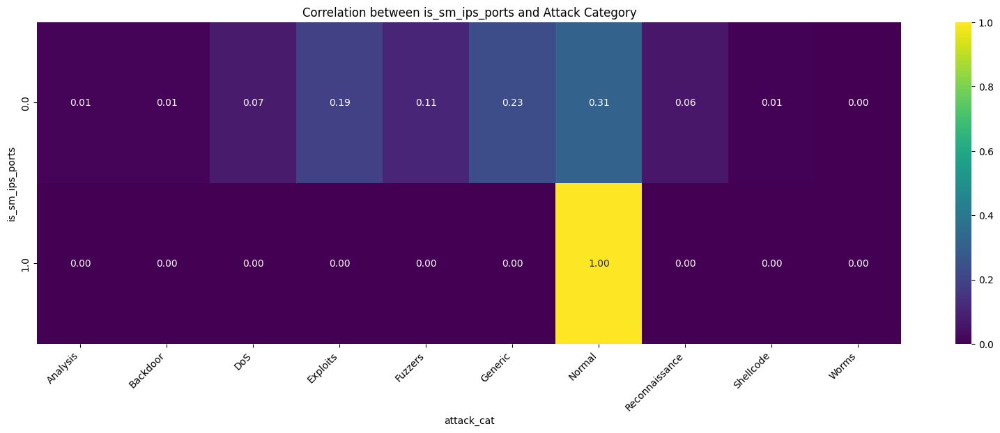

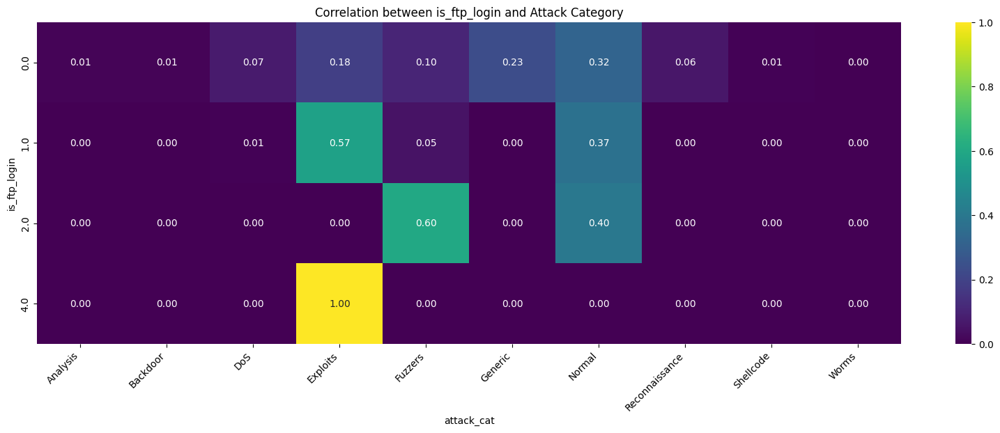

In [40]:
for col in categorical_features:
    if (col != 'attack_cat'):
      crosstab = pd.crosstab(df[col], df['attack_cat'], normalize='index')

      plt.figure(figsize=(20, 30 if col == 'proto' else 6))
      sns.heatmap(crosstab, annot=True, cmap='viridis', fmt=".2f")
      plt.title(f"Correlation between {col} and Attack Category")
      plt.xticks(rotation=45, ha='right')
      plt.show()

### Numeric features

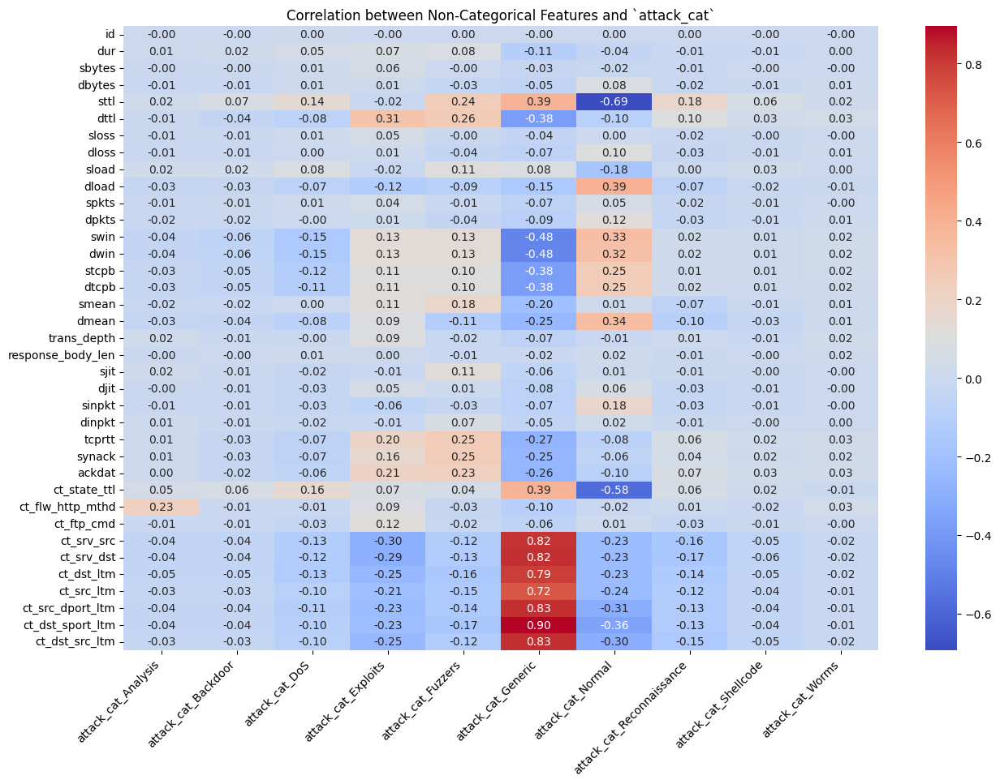

In [41]:
df_encoded = df.copy()

df_encoded = pd.get_dummies(df_encoded, columns=['attack_cat'], prefix=['attack_cat'])

correlation_matrix = df_encoded[noncategorical_features + [col for col in df_encoded.columns if 'attack_cat_' in col]].corr()
attack_cat_corr = correlation_matrix[[col for col in df_encoded.columns if 'attack_cat_' in col]].loc[noncategorical_features]

plt.figure(figsize=(15, 10))
sns.heatmap(attack_cat_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation between Non-Categorical Features and `attack_cat`")
plt.xticks(rotation=45, ha='right')
plt.show()

# 1. Split Training Set and Validation Set

Splitting the training and validation set works as an early diagnostic towards the performance of the model we train. This is done before the preprocessing steps to **avoid data leakage inbetween the sets**. If you want to use k-fold cross-validation, split the data later and do the cleaning and preprocessing separately for each split.

Note: For training, you should use the data contained in the `train` folder given by the TA. The `test` data is only used for kaggle submission.

In [42]:
# Split training set and validation set here, store into variables train_set and val_set.
# Remember to also keep the original training set before splitting. This will come important later.
# train_set, val_set = ...

original_train = df.copy()
le_attack_cat = LabelEncoder()
df['attack_cat'] = le_attack_cat.fit_transform(df['attack_cat'])

train_set, val_set = train_test_split(df, test_size=0.2, random_state=42)

# 2. Data Cleaning and Preprocessing

This step is the first thing to be done once a Data Scientist have grasped a general knowledge of the data. Raw data is **seldom ready for training**, therefore steps need to be taken to clean and format the data for the Machine Learning model to interpret.

By performing data cleaning and preprocessing, you ensure that your dataset is ready for model training, leading to more accurate and reliable machine learning results. These steps are essential for transforming raw data into a format that machine learning algorithms can effectively learn from and make predictions.

We will give some common methods for you to try, but you only have to **at least implement one method for each process**. For each step that you will do, **please explain the reason why did you do that process. Write it in a markdown cell under the code cell you wrote.**

## A. Data Cleaning

**Data cleaning** is the crucial first step in preparing your dataset for machine learning. Raw data collected from various sources is often messy and may contain errors, missing values, and inconsistencies. Data cleaning involves the following steps:

1. **Handling Missing Data:** Identify and address missing values in the dataset. This can include imputing missing values, removing rows or columns with excessive missing data, or using more advanced techniques like interpolation.

2. **Dealing with Outliers:** Identify and handle outliers, which are data points significantly different from the rest of the dataset. Outliers can be removed or transformed to improve model performance.

3. **Data Validation:** Check for data integrity and consistency. Ensure that data types are correct, categorical variables have consistent labels, and numerical values fall within expected ranges.

4. **Removing Duplicates:** Identify and remove duplicate rows, as they can skew the model's training process and evaluation metrics.

5. **Feature Engineering**: Create new features or modify existing ones to extract relevant information. This step can involve scaling, normalizing, or encoding features for better model interpretability.

### I. Handling Missing Data

Missing data can adversely affect the performance and accuracy of machine learning models. There are several strategies to handle missing data in machine learning:

1. **Data Imputation:**

    a. **Mean, Median, or Mode Imputation:** For numerical features, you can replace missing values with the mean, median, or mode of the non-missing values in the same feature. This method is simple and often effective when data is missing at random.

    b. **Constant Value Imputation:** You can replace missing values with a predefined constant value (e.g., 0) if it makes sense for your dataset and problem.

    c. **Imputation Using Predictive Models:** More advanced techniques involve using predictive models to estimate missing values. For example, you can train a regression model to predict missing numerical values or a classification model to predict missing categorical values.

2. **Deletion of Missing Data:**

    a. **Listwise Deletion:** In cases where the amount of missing data is relatively small, you can simply remove rows with missing values from your dataset. However, this approach can lead to a loss of valuable information.

    b. **Column (Feature) Deletion:** If a feature has a large number of missing values and is not critical for your analysis, you can consider removing that feature altogether.

3. **Domain-Specific Strategies:**

    a. **Domain Knowledge:** In some cases, domain knowledge can guide the imputation process. For example, if you know that missing values are related to a specific condition, you can impute them accordingly.

4. **Imputation Libraries:**

    a. **Scikit-Learn:** Scikit-Learn provides a `SimpleImputer` class that can handle basic imputation strategies like mean, median, and mode imputation.

    b. **Fancyimpute:** Fancyimpute is a Python library that offers more advanced imputation techniques, including matrix factorization, k-nearest neighbors, and deep learning-based methods.

The choice of imputation method should be guided by the nature of your data, the amount of missing data, the problem you are trying to solve, and the assumptions you are willing to make.

In [43]:
from sklearn.impute import SimpleImputer

class FeatureImputer(BaseEstimator, TransformerMixin):
    def __init__(self, strategy='mean', fill_value=None):
        """
        Initialize the imputer for handling missing values.

        :param strategy: The strategy to use for imputation ('mean', 'median', 'most_frequent', 'constant').
                         Default is 'mean'.
        :param fill_value: The value to use for the 'constant' strategy. Default is None.
        """
        self.strategy = strategy
        self.fill_value = fill_value
        self.imputer = SimpleImputer(strategy=self.strategy, fill_value=self.fill_value)

    def fit(self, X):
        """
        Fit the imputer to the data.

        :param X: Features data with missing values
        """
        self.imputer.fit(X)

    def transform(self, X):
        """
        Transform the data by imputing the missing values.

        :param X: Features data with missing values
        :return: Data with missing values imputed
        """
        return self.imputer.transform(X)

    def fit_transform(self, X, y=None):
        """
        Fit the imputer and transform the data.

        :param X: Features data with missing values
        :return: Data with missing values imputed
        """
        return self.imputer.fit_transform(X)

    def get_imputation_statistics(self):
        """
        Get the imputation statistics (e.g., mean or median values used for imputation).

        :return: The statistics used for imputation (depending on the strategy)
        """
        return self.imputer.statistics_

### II. Dealing with Outliers

Outliers are data points that significantly differ from the majority of the data. They can be unusually high or low values that do not fit the pattern of the rest of the dataset. Outliers can significantly impact model performance, so it is important to handle them properly.

Some methods to handle outliers:
1. **Imputation**: Replace with mean, median, or a boundary value.
2. **Clipping**: Cap values to upper and lower limits.
3. **Transformation**: Use log, square root, or power transformations to reduce their influence.
4. **Model-Based**: Use algorithms robust to outliers (e.g., tree-based models, Huber regression).

In [44]:
class OutlierClipper(BaseEstimator, TransformerMixin):
    def __init__(self, lower_percentile=0.01, upper_percentile=0.99):
        self.lower_percentile = lower_percentile
        self.upper_percentile = upper_percentile

    def fit(self, X, y=None):
        # Ensure X is a DataFrame during fitting
        if not isinstance(X, np.ndarray):
            X = np.array(X)
        self.lower_bounds = np.percentile(X, self.lower_percentile * 100, axis=0)
        self.upper_bounds = np.percentile(X, self.upper_percentile * 100, axis=0)
        return self

    def transform(self, X):
        # Ensure X is a NumPy array during transformation
        if not isinstance(X, np.ndarray):
            X = np.array(X)
        return np.clip(X, self.lower_bounds, self.upper_bounds)

### III. Remove Duplicates
Handling duplicate values is crucial because they can compromise data integrity, leading to inaccurate analysis and insights. Duplicate entries can bias machine learning models, causing overfitting and reducing their ability to generalize to new data. They also inflate the dataset size unnecessarily, increasing computational costs and processing times. Additionally, duplicates can distort statistical measures and lead to inconsistencies, ultimately affecting the reliability of data-driven decisions and reporting. Ensuring data quality by removing duplicates is essential for accurate, efficient, and consistent analysis.

In [45]:
class DuplicateRemover(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X

    def fit_transform(self, X, y):
        self.fit(X,y)
        X_unique, indices = np.unique(X[0], axis=0, return_index=True)
        y_unique = X[1][indices]
        return X_unique, y_unique

### IV. Feature Engineering

**Feature engineering** involves creating new features (input variables) or transforming existing ones to improve the performance of machine learning models. Feature engineering aims to enhance the model's ability to learn patterns and make accurate predictions from the data. It's often said that "good features make good models."

1. **Feature Selection:** Feature engineering can involve selecting the most relevant and informative features from the dataset. Removing irrelevant or redundant features not only simplifies the model but also reduces the risk of overfitting.

2. **Creating New Features:** Sometimes, the existing features may not capture the underlying patterns effectively. In such cases, engineers create new features that provide additional information. For example:
   
   - **Polynomial Features:** Engineers may create new features by taking the square, cube, or other higher-order terms of existing numerical features. This can help capture nonlinear relationships.
   
   - **Interaction Features:** Interaction features are created by combining two or more existing features. For example, if you have features "length" and "width," you can create an "area" feature by multiplying them.

3. **Binning or Discretization:** Continuous numerical features can be divided into bins or categories. For instance, age values can be grouped into bins like "child," "adult," and "senior."

4. **Domain-Specific Feature Engineering:** Depending on the domain and problem, engineers may create domain-specific features. For example, in fraud detection, features related to transaction history and user behavior may be engineered to identify anomalies.

Feature engineering is both a creative and iterative process. It requires a deep understanding of the data, domain knowledge, and experimentation to determine which features will enhance the model's predictive power.

In [46]:
from sklearn.feature_selection import SelectKBest, f_classif

class FeatureSelection(BaseEstimator, TransformerMixin):
    def __init__(self, k=10, score_func=f_classif):
        """
        Initialize the feature selection process.

        :param k: Number of top features to select. Default is 10.
        :param score_func: Scoring function to evaluate the features. Default is f_classif (ANOVA F-test).
        """
        self.k = k
        self.score_func = score_func
        self.selector = SelectKBest(score_func=self.score_func, k=self.k)

    def fit(self, X, y):
        """
        Fit the selector to the data.

        :param X: Features
        :param y: Target labels
        """
        self.selector.fit(X, y)

    def transform(self, X, y=None):
        """
        Apply the feature selection transformation.

        :param X: Features to transform
        :return: Transformed features
        """
        return self.selector.transform(X)

    def fit_transform(self, X,y):
        """
        Fit the selector and apply the transformation.

        :param X: Features
        :param y: Target labels
        :return: Transformed features
        """
        return self.selector.fit_transform(X, y)

    def get_support(self):
        """
        Get the mask of selected features.

        :return: Mask of selected features (True/False)
        """
        return self.selector.get_support()

    def get_selected_features(self):
        """
        Get the indices of the selected features.

        :return: List of selected feature indices
        """
        return self.selector.get_support(indices=True)

## B. Data Preprocessing

**Data preprocessing** is a broader step that encompasses both data cleaning and additional transformations to make the data suitable for machine learning algorithms. Its primary goals are:

1. **Feature Scaling:** Ensure that numerical features have similar scales. Common techniques include Min-Max scaling (scaling to a specific range) or standardization (mean-centered, unit variance).

2. **Encoding Categorical Variables:** Machine learning models typically work with numerical data, so categorical variables need to be encoded. This can be done using one-hot encoding, label encoding, or more advanced methods like target encoding.

3. **Handling Imbalanced Classes:** If dealing with imbalanced classes in a binary classification task, apply techniques such as oversampling, undersampling, or using different evaluation metrics to address class imbalance.

4. **Dimensionality Reduction:** Reduce the number of features using techniques like Principal Component Analysis (PCA) or feature selection to simplify the model and potentially improve its performance.

5. **Normalization:** Normalize data to achieve a standard distribution. This is particularly important for algorithms that assume normally distributed data.

### Notes on Preprocessing processes

It is advised to create functions or classes that have the same/similar type of inputs and outputs, so you can add, remove, or swap the order of the processes easily. You can implement the functions or classes by yourself

or

use `sklearn` library. To create a new preprocessing component in `sklearn`, implement a corresponding class that includes:
1. Inheritance to `BaseEstimator` and `TransformerMixin`
2. The method `fit`
3. The method `transform`

In [47]:
# Example

# from sklearn.base import BaseEstimator, TransformerMixin

# class FeatureEncoder(BaseEstimator, TransformerMixin):

#     def fit(self, X, y=None):

#         # Fit the encoder here

#         return self

#     def transform(self, X):
#         X_encoded = X.copy()

#         # Encode the categorical variables here

#         return X_encoded

### I. Feature Scaling

**Feature scaling** is a preprocessing technique used in machine learning to standardize the range of independent variables or features of data. The primary goal of feature scaling is to ensure that all features contribute equally to the training process and that machine learning algorithms can work effectively with the data.

Here are the main reasons why feature scaling is important:

1. **Algorithm Sensitivity:** Many machine learning algorithms are sensitive to the scale of input features. If the scales of features are significantly different, some algorithms may perform poorly or take much longer to converge.

2. **Distance-Based Algorithms:** Algorithms that rely on distances or similarities between data points, such as k-nearest neighbors (KNN) and support vector machines (SVM), can be influenced by feature scales. Features with larger scales may dominate the distance calculations.

3. **Regularization:** Regularization techniques, like L1 (Lasso) and L2 (Ridge) regularization, add penalty terms based on feature coefficients. Scaling ensures that all features are treated equally in the regularization process.

Common methods for feature scaling include:

1. **Min-Max Scaling (Normalization):** This method scales features to a specific range, typically [0, 1]. It's done using the following formula:

   $$X' = \frac{X - X_{min}}{X_{max} - X_{min}}$$

   - Here, $X$ is the original feature value, $X_{min}$ is the minimum value of the feature, and $X_{max}$ is the maximum value of the feature.  
<br />
<br />
2. **Standardization (Z-score Scaling):** This method scales features to have a mean (average) of 0 and a standard deviation of 1. It's done using the following formula:

   $$X' = \frac{X - \mu}{\sigma}$$

   - $X$ is the original feature value, $\mu$ is the mean of the feature, and $\sigma$ is the standard deviation of the feature.  
<br />
<br />
3. **Robust Scaling:** Robust scaling is a method that scales features to the interquartile range (IQR) and is less affected by outliers. It's calculated as:

   $$X' = \frac{X - Q1}{Q3 - Q1}$$

   - $X$ is the original feature value, $Q1$ is the first quartile (25th percentile), and $Q3$ is the third quartile (75th percentile) of the feature.  
<br />
<br />
4. **Log Transformation:** In cases where data is highly skewed or has a heavy-tailed distribution, taking the logarithm of the feature values can help stabilize the variance and improve scaling.

The choice of scaling method depends on the characteristics of your data and the requirements of your machine learning algorithm. **Min-max scaling and standardization are the most commonly used techniques and work well for many datasets.**

Scaling should be applied separately to each training and test set to prevent data leakage from the test set into the training set. Additionally, **some algorithms may not require feature scaling, particularly tree-based models.**

In [48]:
class FeatureScaling(BaseEstimator, TransformerMixin):
    def __init__(self, method="standard"):
        self.method = method
        self.scaler = None

    def fit(self, X, y=None):
        if self.method == "standard":
            self.scaler = StandardScaler().fit(X)
        elif self.method == "minmax":
            self.scaler = MinMaxScaler().fit(X)
        return self

    def transform(self, X):
        return self.scaler.transform(X) if self.scaler else X


### II. Feature Encoding

**Feature encoding**, also known as **categorical encoding**, is the process of converting categorical data (non-numeric data) into a numerical format so that it can be used as input for machine learning algorithms. Most machine learning models require numerical data for training and prediction, so feature encoding is a critical step in data preprocessing.

Categorical data can take various forms, including:

1. **Nominal Data:** Categories with no intrinsic order, like colors or country names.  

2. **Ordinal Data:** Categories with a meaningful order but not necessarily equidistant, like education levels (e.g., "high school," "bachelor's," "master's").

There are several common methods for encoding categorical data:

1. **Label Encoding:**

   - Label encoding assigns a unique integer to each category in a feature.
   - It's suitable for ordinal data where there's a clear order among categories.
   - For example, if you have an "education" feature with values "high school," "bachelor's," and "master's," you can encode them as 0, 1, and 2, respectively.
<br />
<br />
2. **One-Hot Encoding:**

   - One-hot encoding creates a binary (0 or 1) column for each category in a nominal feature.
   - It's suitable for nominal data where there's no inherent order among categories.
   - Each category becomes a new feature, and the presence (1) or absence (0) of a category is indicated for each row.
<br />
<br />
3. **Target Encoding (Mean Encoding):**

   - Target encoding replaces each category with the mean of the target variable for that category.
   - It's often used for classification problems.

In [49]:
class MixedEncodingTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, onehot_columns=None, label_columns=None):
        """
        Parameters:
        - onehot_columns: List of column indices for one-hot encoding.
        - label_columns: List of column indices for label encoding.
        """
        self.onehot_columns = onehot_columns or []
        self.label_columns = label_columns or []
        self.onehot_encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore') if self.onehot_columns else None
        self.label_encoder = LabelEncoder() if self.label_columns else None

    def fit(self, X, y=None):
        """
        Fit the transformers to the data.

        Parameters:
        - X: Input data array (2D).
        - y: Optional target labels, not used in this transformer.
        """
        if self.onehot_columns:
            # Fit one-hot encoder for the specified columns
            self.onehot_encoder.fit(X[:, self.onehot_columns])

        if self.label_columns:
            # Fit label encoder for the specified columns
            for col in self.label_columns:
                self.label_encoder.fit(X[:, col])

        return self

    def transform(self, X):
        """
        Transform the input data using the appropriate encoding methods.

        Parameters:
        - X: Input data array (2D).
        """
        X_transformed = X.copy()

        if self.onehot_columns:
            onehot_encoded = self.onehot_encoder.transform(X[:, self.onehot_columns])
            # Replace the original columns with one-hot encoded columns
            X_transformed = np.delete(X_transformed, self.onehot_columns, axis=1)
            X_transformed = np.hstack([X_transformed, onehot_encoded])

        if self.label_columns:
            for col in self.label_columns:
                X_transformed[:, col] = self.label_encoder.transform(X[:, col])

        return X_transformed

    def fit_transform(self, X, y=None):
        """
        Fit the transformers and transform the data.

        Parameters:
        - X: Input data array (2D).
        - y: Optional target labels, not used in this transformer.
        """
        self.fit(X, y)
        return self.transform(X)


### III. Handling Imbalanced Dataset

**Handling imbalanced datasets** is important because imbalanced data can lead to several issues that negatively impact the performance and reliability of machine learning models. Here are some key reasons:

1. **Biased Model Performance**:

 - Models trained on imbalanced data tend to be biased towards the majority class, leading to poor performance on the minority class. This can result in misleading accuracy metrics.

2. **Misleading Accuracy**:

 - High overall accuracy can be misleading in imbalanced datasets. For example, if 95% of the data belongs to one class, a model that always predicts the majority class will have 95% accuracy but will fail to identify the minority class.

3. **Poor Generalization**:

 - Models trained on imbalanced data may not generalize well to new, unseen data, especially if the minority class is underrepresented.


Some methods to handle imbalanced datasets:
1. **Resampling Methods**:

 - Oversampling: Increase the number of instances in the minority class by duplicating or generating synthetic samples (e.g., SMOTE).
 - Undersampling: Reduce the number of instances in the majority class to balance the dataset.

2. **Evaluation Metrics**:

 - Use appropriate evaluation metrics such as precision, recall, F1-score, ROC-AUC, and confusion matrix instead of accuracy to better assess model performance on imbalanced data.

3. **Algorithmic Approaches**:

 - Use algorithms that are designed to handle imbalanced data, such as decision trees, random forests, or ensemble methods.
 - Adjust class weights in algorithms to give more importance to the minority class.

In [50]:
class SMOTEHandler(BaseEstimator, TransformerMixin):
    def __init__(self, random_state=None, sampling_strategy='auto'):
        """
        Initialize the SMOTE handler.

        :param random_state: Random state for reproducibility (default is None)
        :param sampling_strategy: Defines the sampling strategy for SMOTE (default is 'auto')
        """
        self.random_state = random_state
        self.sampling_strategy = sampling_strategy
        self.smote = SMOTE(random_state=self.random_state, sampling_strategy=self.sampling_strategy)

    def fit(self, X, y):
        """
        Fit the SMOTE model to the training data.

        :param X: Feature matrix
        :param y: Target vector
        :return: self
        """
        self.smote.fit(X, y)
        return self

    def transform(self, X):
        return X

    def fit_transform(self, X, y):
        """
        Fit and transform the dataset in one step.

        :param X: Feature matrix
        :param y: Target vector
        :return: Balanced feature matrix X, and target vector y
        """
        return self.smote.fit_resample(X, y)

### IV. Data Normalization

Data normalization is used to achieve a standard distribution. Without normalization, models or processes that rely on the assumption of normality may not work correctly. Normalization helps reduce the magnitude effect and ensures numerical stability during optimization.

In [51]:
from sklearn.preprocessing import Normalizer

class DataNormalizer(BaseEstimator, TransformerMixin):
    def __init__(self, norm='l2'):
        """
        Initialize the data normalizer.

        :param norm: Norm to use for normalization, can be 'l1', 'l2', or 'max'. Default is 'l2'.
        """
        self.norm = norm
        self.normalizer = Normalizer(norm=self.norm)

    def fit(self, X, y=None):
        """
        Fit the normalizer to the data.

        :param X: Feature matrix
        :param y: Target vector (optional)
        :return: self
        """
        self.normalizer.fit(X)
        return self

    def transform(self, X):
        """
        Normalize the data.

        :param X: Feature matrix
        :return: Normalized feature matrix
        """
        return self.normalizer.transform(X)

    def fit_transform(self, X, y=None):
        """
        Fit and transform the data in one step.

        :param X: Feature matrix
        :param y: Target vector (optional)
        :return: Normalized feature matrix
        """
        return self.normalizer.fit_transform(X)

### V. Dimensionality Reduction

Dimensionality reduction is a technique used in data preprocessing to reduce the number of input features (dimensions) in a dataset while retaining as much important information as possible. It is essential when dealing with high-dimensional data, where too many features can cause problems like increased computational costs, overfitting, and difficulty in visualization. Reducing dimensions simplifies the data, making it easier to analyze and improving the performance of machine learning models.

One of the main approaches to dimensionality reduction is feature extraction. Feature extraction creates new, smaller sets of features that capture the essence of the original data. Common techniques include:

1. **Principal Component Analysis (PCA)**: Converts correlated features into a smaller number of uncorrelated "principal components."
2. **t-SNE (t-Distributed Stochastic Neighbor Embedding)**: A visualization-focused method to project high-dimensional data into 2D or 3D spaces.
3. **Autoencoders**: Neural networks that learn compressed representations of the data.

In [52]:
class DimensionalityReducer(BaseEstimator, TransformerMixin):
    def __init__(self, n_components=None):
        """
        Initialize the PCA dimensionality reducer.

        :param n_components: Number of principal components to keep.
                              If None, keeps all components.
                              Can also be a float (explained variance ratio).
        """
        self.n_components = n_components
        self.pca = PCA(n_components=self.n_components)

    def fit(self, X, y=None):
        """
        Fit the PCA model to the data.

        :param X: Feature matrix.
        :param y: Target vector (optional).
        :return: self
        """
        self.pca.fit(X)
        return self

    def transform(self, X):
        """
        Transform the data to the lower-dimensional space.

        :param X: Feature matrix.
        :return: Transformed data in lower-dimensional space.
        """
        return self.pca.transform(X)

    def fit_transform(self, X, y=None):
        """
        Fit and transform the data in one step.

        :param X: Feature matrix.
        :param y: Target vector (optional).
        :return: Transformed data in lower-dimensional space.
        """
        return self.pca.fit_transform(X[0])

    def explained_variance_ratio(self):
        """
        Return the explained variance ratio of each principal component.

        :return: Array of explained variance ratios for each component.
        """
        return self.pca.explained_variance_ratio_

    def components(self):
        """
        Return the principal components (eigenvectors).

        :return: Matrix of principal components.
        """
        return self.pca.components_

In [53]:
class FeatureDiscretizer(BaseEstimator, TransformerMixin):
    def __init__(self, features, bins=10, strategy='uniform'):
        self.features = features  # List of features to discretize
        self.bins = bins  # Number of bins or discretization strategy
        self.strategy = strategy  # Discretization strategy (e.g., 'uniform', 'quantile')
        self.discretizers = {}  # Store discretizers for each feature

    def fit(self, X, y=None):
        X_df = pd.DataFrame(X, columns=self.features)  # Create DataFrame for easier handling

        for feature in self.features:
            # Create discretizer based on the chosen strategy
            if self.strategy == 'uniform':
                discretizer = np.linspace(X_df[feature].min(), X_df[feature].max(), self.bins + 1)
            elif self.strategy == 'quantile':
                discretizer = np.quantile(X_df[feature], np.linspace(0, 1, self.bins + 1))
            else:
                raise ValueError(f"Invalid strategy: {self.strategy}")

            self.discretizers[feature] = discretizer

        return self

    def transform(self, X):
        X_df = pd.DataFrame(X, columns=self.features)  # Create DataFrame for easier handling

        for feature in self.features:
            discretizer = self.discretizers[feature]
            # Apply discretization to the feature
            X_df[feature] = pd.cut(X_df[feature], bins=discretizer, labels=False, include_lowest=True, duplicates='drop')

        return X_df.values # Convert back to numpy array

# 3. Compile Preprocessing Pipeline

All of the preprocessing classes or functions defined earlier will be compiled in this step.

If you use sklearn to create preprocessing classes, you can list your preprocessing classes in the Pipeline object sequentially, and then fit and transform your data.

#### General Pipeline

In [54]:
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.preprocessing import FunctionTransformer

categorical_without_target = [x for x in categorical_features if x != 'attack_cat']

numeric_transformer = Pipeline(steps=[
    ('imputer', FeatureImputer(strategy='median')),
    ('outlier_clipper', OutlierClipper(lower_percentile=0.01, upper_percentile=0.99)),
    ('scaler', FeatureScaling(method='standard'))
])


categorical_transformer = Pipeline(steps=[
    ('imputer', FeatureImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, noncategorical_features),
        ('cat', categorical_transformer, categorical_without_target)
    ]
)

pipe = ImbPipeline([
    ('preprocessor', preprocessor),
    ('feature_selector', FeatureSelection(k=10)),
    ('smote', SMOTEHandler(random_state=42, sampling_strategy='auto')),
    ('duplicate_remover', DuplicateRemover()),
])

#### ID3 Specific Pipeline

In [55]:
numeric_transformer_id3 = Pipeline(steps=[
    ('imputer', FeatureImputer(strategy='median')),
    ('outlier_clipper', OutlierClipper(lower_percentile=0.01, upper_percentile=0.99)),
    ('discretizer', FeatureDiscretizer(features=noncategorical_features, bins=10, strategy='uniform')),
    ('scaler', FeatureScaling(method='standard'))
])

categorical_transformer_id3 = Pipeline(steps=[
    ('imputer', FeatureImputer(strategy='most_frequent')),
    ('encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
])

preprocessor_id3 = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer_id3, noncategorical_features),
        ('cat', categorical_transformer_id3, categorical_without_target)
    ]
)

pipe_id3 = ImbPipeline([
    ('preprocessor', preprocessor_id3),
])

#### Apply Pipeline to Training Data

In [56]:
x_train_set = train_set.drop('attack_cat', axis=1)
y_train_set = train_set['attack_cat']
x_val_set = val_set.drop('attack_cat', axis=1)
y_val_set = val_set['attack_cat']
x_train_set_processed, y_train_set_processed = pipe.fit_transform(x_train_set, y_train_set)

x_val_set_processed = pipe.transform(x_val_set)

x_train_set_id3 = train_set.drop('attack_cat', axis=1)
y_train_set_id3 = train_set['attack_cat']
x_val_set_id3 = val_set.drop('attack_cat', axis=1)
y_val_set_id3 = val_set['attack_cat']
x_train_set_processed_id3 = pipe_id3.fit_transform(x_train_set_id3, y_train_set_id3)

x_val_set_processed_id3 = pipe_id3.transform(x_val_set_id3)

c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(
c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\pipeline.py:62: FutureWarning: This Pipe

# 4. Modeling and Validation

Modelling is the process of building your own machine learning models to solve specific problems, or in this assignment context, predicting the target feature `attack_cat`. Validation is the process of evaluating your trained model using the validation set or cross-validation method and providing some metrics that can help you decide what to do in the next iteration of development.

### Saving and Loading Model

##### Saving Model

In [57]:
# You can load your model by executing these command. The model then will be loaded to the loaded_model variable
# with open ("model-nb.pkl", "rb") as file:
#     loaded_model = pickle.load(file)

In [ ]:

# You can save your model by running this after training your model
# import pickle
# with open('model-nb.pkl', 'wb') as file:
#     pickle.dump(nb, file)

## A. KNN

In [26]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train_set_processed, y_train_set_processed)
y_pred = knn.predict(x_val_set_processed)
print(y_pred)
accuracy = accuracy_score(y_val_set, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision = precision_score(y_val_set, y_pred, average='weighted', zero_division=0)
print(f"Precision Score: {precision:.4f}")

conf_matrix = confusion_matrix(y_val_set, y_pred)
print(f"Confusion Matrix:\n{conf_matrix}")

class_report = classification_report(y_val_set, y_pred, zero_division=0)
print(f"Classification Report:\n{class_report}")

[5 5 0 ... 6 9 2]
Accuracy: 0.5379
Precision Score: 0.7377
Confusion Matrix:
[[ 163  129   30   19    6    1    4   12    1   19]
 [  91  123   39    9   16    0    0   17   13   59]
 [ 755  796  218   72   51    1    4  114   78  370]
 [2171 1300  782  470  136    2   21  227  249 1278]
 [ 394  549  158   54 1477   22   85  195  244  459]
 [  46   26   12    9   69 7741    9   16   12   35]
 [ 460  449  487   77  905   14 8377  147  127  211]
 [ 139  202   55   43   72    1    9  211  409  929]
 [   6   15    6    3   19    0    2   27   66  115]
 [   1    1    1    2    1    0    0    3    2   17]]
Classification Report:
              precision    recall  f1-score   support

           0       0.04      0.42      0.07       384
           1       0.03      0.34      0.06       367
           2       0.12      0.09      0.10      2459
           3       0.62      0.07      0.13      6636
           4       0.54      0.41      0.46      3637
           5       0.99      0.97      0.98 

In [27]:
class KNN:
    def __init__(self, k: int, ord: float):
        self.k_neighbor = k
        self.ord = ord
        self.X_train = None
        self.Y_train = None

    def fit(self, x, y):
        self.X_train = np.array(x)
        self.Y_train = np.array(y)

    def predict(self, x):
        x = np.array(x)
        pred = []
        for i, fits in enumerate(x):
            distances = np.linalg.norm(self.X_train - fits, ord=self.ord, axis=1)
            nearest_features = np.argsort(distances)[:self.k_neighbor]
            nearest_labels = self.Y_train[nearest_features]
            unique, counts = np.unique(nearest_labels, return_counts=True)
            pred.append(unique[np.argmax(counts)])
        return np.array(pred)

knn_custom = KNN(6,1)
knn_custom.fit(x_train_set_processed, y_train_set_processed)
y_pred = knn_custom.predict(x_val_set_processed)

# Hitung akurasi
accuracy = accuracy_score(y_val_set, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision = precision_score(y_val_set, y_pred, average='weighted', zero_division=0)
print(f"Precision Score: {precision:.4f}")

# Matriks kebingungan (confusion matrix)
conf_matrix = confusion_matrix(y_val_set, y_pred)
print(f"Confusion Matrix:\n{conf_matrix}")

# Laporan klasifikasi
class_report = classification_report(y_val_set, y_pred, zero_division=0)
print(f"Classification Report:\n{class_report}")


Accuracy: 0.5413
Precision Score: 0.7423
Confusion Matrix:
[[ 172  125   38   16    4    1    4    6    1   17]
 [ 104  117   36   10   13    0    1   15   13   58]
 [ 814  758  238   71   52    0    1   95   77  353]
 [2236 1276  782  531  121    2   29  197  252 1210]
 [ 487  431  173   61 1503   21   78  193  227  463]
 [  43   27   14   12   75 7738    8   11   12   35]
 [ 519  336  498   84  958   14 8384  134  117  210]
 [ 149  178   54   43   77    1    8  213  408  939]
 [   6    8    6    3   16    0    3   29   69  119]
 [   0    1    1    3    0    0    1    2    3   17]]
Classification Report:
              precision    recall  f1-score   support

           0       0.04      0.45      0.07       384
           1       0.04      0.32      0.06       367
           2       0.13      0.10      0.11      2459
           3       0.64      0.08      0.14      6636
           4       0.53      0.41      0.47      3637
           5       0.99      0.97      0.98      7975
        

## B. Naive Bayes

In [28]:
from sklearn.naive_bayes import GaussianNB

# Initialize Gaussian Naive Bayes
gnb = GaussianNB()

# Fit the model to the training data
gnb.fit(x_train_set_processed, y_train_set_processed)

# Make predictions on the validation set
y_pred = gnb.predict(x_val_set_processed)

# Calculate accuracy
accuracy = accuracy_score(y_val_set, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision = precision_score(y_val_set, y_pred, average='weighted', zero_division=0)
print(f"Precision Score: {precision:.4f}")

# Compute confusion matrix
conf_matrix = confusion_matrix(y_val_set, y_pred)
print(f"Confusion Matrix:\n{conf_matrix}")

# Generate classification report
class_report = classification_report(y_val_set, y_pred, zero_division=0)
print(f"Classification Report:\n{class_report}")


Accuracy: 0.3049
Precision Score: 0.7103
Confusion Matrix:
[[ 305    0    0    0    0    1    0    0   78    0]
 [ 216    0    0    0    0    1    0    0  150    0]
 [1500    0    0    3    0   13   24    7  901   11]
 [4192    0    0   22    4   13   41    4 2358    2]
 [1006    0    0    3  151  154   21  133 2118   51]
 [  78    0    0    0   15 7750   53    2   75    2]
 [6972    1    1    1  151  223 2204   65 1614   22]
 [ 247    0    0    0    1    1    4    2 1790   25]
 [   0    0    0    0    2    0    0    0  257    0]
 [   1    0    0    0    0    0    0    0   27    0]]
Classification Report:
              precision    recall  f1-score   support

           0       0.02      0.79      0.04       384
           1       0.00      0.00      0.00       367
           2       0.00      0.00      0.00      2459
           3       0.76      0.00      0.01      6636
           4       0.47      0.04      0.08      3637
           5       0.95      0.97      0.96      7975
        

## Naive Bayes Custom

In [29]:
class NaiveBayes:
    def __init__(self):
        self.class_priors = {}  # P(vj): Prior probabilities
        self.mean = {}  # Mean for numerical features per class
        self.var = {}  # Variance for numerical features per class
        self.classes = None

    def fit(self, X, y):
        """
        Train the Naive Bayes model on numerical data.
        X: np.ndarray - Feature matrix
        y: np.ndarray or pd.Series - Target labels
        """
        # Ensure X is a numpy array
        if isinstance(X, tuple):
            X = X[0]  # Extract the first element if X is a tuple
        X = np.array(X)  # Ensure X is a numpy array

        self.classes = np.unique(y)  # Unique classes in the target
        n_samples = len(y)

        for cls in self.classes:
            # Calculate priors P(vj)
            class_count = np.sum(y == cls)
            self.class_priors[cls] = class_count / n_samples

            # Subset data for the current class
            X_c = X[np.array(y == cls)]  # Convert boolean mask to numpy array for indexing

            # Calculate mean and variance for numerical features
            self.mean[cls] = X_c.mean(axis=0)
            self.var[cls] = X_c.var(axis=0)

    def _likelihood_num(self, class_idx, x):
        """
        Compute likelihood for numerical features using Gaussian distribution.
        class_idx: Class index
        x: Feature vector
        """
        mean = self.mean[class_idx]
        var = self.var[class_idx]
        likelihood = -((x - mean) ** 2) / (2 * var + 1e-6)  # Add small value to avoid division by zero
        likelihood = np.exp(likelihood) / np.sqrt(2 * np.pi * var + 1e-6)
        return likelihood.prod()

    def predict(self, X):
        """
        Predict the class for each sample in X.
        X: np.ndarray - Feature matrix
        """
        # Ensure X is a numpy array
        if isinstance(X, tuple):
            X = X[0]  # Extract the first element if X is a tuple
        X = np.array(X)  # Ensure X is a numpy array

        predictions = []
        for x in X:  # Iterate over each sample
            class_probs = {}
            for cls in self.classes:
                # Start with prior P(vj)
                class_prob = self.class_priors[cls]

                # Multiply with likelihoods for all features
                class_prob *= self._likelihood_num(cls, x)

                class_probs[cls] = class_prob

            # Assign the class with the highest probability
            predictions.append(max(class_probs, key=class_probs.get))
        return np.array(predictions)

    def accuracy(self, y_true, y_pred):
        """
        Calculate accuracy of the model.
        y_true: np.ndarray - True labels
        y_pred: np.ndarray - Predicted labels
        """
        return np.mean(y_true == y_pred)

nb = NaiveBayes()
nb.fit(x_train_set_processed, y_train_set_processed)
y_pred = nb.predict(x_val_set_processed)

# Hitung akurasi
accuracy = accuracy_score(y_val_set, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision = precision_score(y_val_set, y_pred, average='weighted', zero_division=0)
print(f"Precision Score: {precision:.4f}")

# Matriks kebingungan (confusion matrix)
conf_matrix = confusion_matrix(y_val_set, y_pred)
print(f"Confusion Matrix:\n{conf_matrix}")

# Laporan klasifikasi
class_report = classification_report(y_val_set, y_pred, zero_division=0)
print(f"Classification Report:\n{class_report}")


Accuracy: 0.3067
Precision Score: 0.7083
Confusion Matrix:
[[ 303    0    0    0    0    2    0    0   78    1]
 [ 216    0    0    0    0    1    0    0  150    0]
 [1490    0    0    3    0   18   24    9  900   15]
 [4152    0    0   29    5   18   41    4 2357   30]
 [ 965    0    0    4  153  156   21  141 2116   81]
 [  78    0    0    0   15 7750   53    2   75    2]
 [6895    0    1    2  172  224 2260   66 1596   38]
 [ 231    0    0    0    2    4    4    2 1786   41]
 [   0    0    0    0    2    0    0    0  257    0]
 [   0    0    0    0    0    0    0    0   27    1]]
Classification Report:
              precision    recall  f1-score   support

           0       0.02      0.79      0.04       384
           1       0.00      0.00      0.00       367
           2       0.00      0.00      0.00      2459
           3       0.76      0.00      0.01      6636
           4       0.44      0.04      0.08      3637
           5       0.95      0.97      0.96      7975
        

## C. ID3

In [30]:
from sklearn.tree import DecisionTreeClassifier

# Inisialisasi DecisionTreeClassifier dengan kriteria 'entropy'
id3 = DecisionTreeClassifier(criterion='entropy', random_state=42)

# Fit model ke data latih
id3.fit(x_train_set_processed_id3, y_train_set_id3)

# Prediksi data validasi
y_pred = id3.predict(x_val_set_processed_id3)

# Hitung akurasi
accuracy = accuracy_score(y_val_set, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision = precision_score(y_val_set, y_pred, average='weighted', zero_division=0)
print(f"Precision Score: {precision:.4f}")

# Matriks kebingungan (confusion matrix)
conf_matrix = confusion_matrix(y_val_set, y_pred)
print(f"Confusion Matrix:\n{conf_matrix}")

# Laporan klasifikasi
class_report = classification_report(y_val_set, y_pred, zero_division=0)
print(f"Classification Report:\n{class_report}")


Accuracy: 0.7354
Precision Score: 0.7352
Confusion Matrix:
[[  49   18   99  165   12    3   27   10    0    1]
 [  19   21  100  176   23    2    8   14    4    0]
 [ 112   98  775 1210   87   29   50   80   16    2]
 [ 150  143 1107 4330  298   77  196  303   18   14]
 [  19   40  144  431 1744   20  824  361   53    1]
 [   3    1   43   82   26 7803    7   10    0    0]
 [  31    5   57  196  923   17 9840  158   27    0]
 [   5   20  127  372  239    7   98 1190   10    2]
 [   0    3   13   23   68    1   34   81   36    0]
 [   0    0    1   13    2    0    1    8    1    2]]
Classification Report:
              precision    recall  f1-score   support

           0       0.13      0.13      0.13       384
           1       0.06      0.06      0.06       367
           2       0.31      0.32      0.31      2459
           3       0.62      0.65      0.64      6636
           4       0.51      0.48      0.49      3637
           5       0.98      0.98      0.98      7975
        

## ID3 Custom

In [31]:
from collections import Counter


class ID3DecisionTree:
    def __init__(self, max_depth=None, min_samples_split=2, min_gain=1e-4, use_gini=False):
        """
        Initialize the ID3 Decision Tree.

        Parameters:
        - max_depth: Maximum depth of the tree (default: None, meaning no limit).
        - min_samples_split: Minimum samples required to split a node.
        - min_gain: Minimum information gain required for a split.
        - use_gini: Use Gini Impurity instead of Entropy.
        """
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.min_gain = min_gain
        self.use_gini = use_gini
        self.tree = None

    def entropy(self, y):
        counts = np.bincount(y)
        probabilities = counts / len(y)
        return -np.sum([p * np.log2(p) for p in probabilities if p > 0])

    def gini(self, y):
        counts = np.bincount(y)
        probabilities = counts / len(y)
        return 1 - np.sum([p ** 2 for p in probabilities])

    def impurity(self, y):
        return self.gini(y) if self.use_gini else self.entropy(y)

    def information_gain(self, X_column, y):
        parent_impurity = self.impurity(y)
        values, counts = np.unique(X_column, return_counts=True)

        weighted_impurity = np.sum(
            [(counts[i] / len(X_column)) * self.impurity(y[X_column == value])
             for i, value in enumerate(values)]
        )
        return parent_impurity - weighted_impurity

    def best_split(self, X, y):
        best_gain = -1
        best_feature = None

        for feature in range(X.shape[1]):
            gain = self.information_gain(X[:, feature], y)
            if gain > best_gain:
                best_gain = gain
                best_feature = feature

        if best_gain < self.min_gain:
            return None
        return best_feature

    def build_tree(self, X, y, depth=0):
        if len(np.unique(y)) == 1:
            return y[0]
        if self.max_depth is not None and depth >= self.max_depth:
            return Counter(y).most_common(1)[0][0]
        if len(y) < self.min_samples_split:
            return Counter(y).most_common(1)[0][0]

        feature = self.best_split(X, y)
        if feature is None:
            return Counter(y).most_common(1)[0][0]

        tree = {feature: {}}
        for value in np.unique(X[:, feature]):
            sub_X = X[X[:, feature] == value]
            sub_y = y[X[:, feature] == value]
            subtree = self.build_tree(sub_X, sub_y, depth + 1)
            tree[feature][value] = subtree

        return tree

    def fit(self, X, y):
        self.tree = self.build_tree(X, y)

    def predict_sample(self, tree, sample):
        if not isinstance(tree, dict):
            return tree
        feature = next(iter(tree))
        value = sample[feature]
        subtree = tree[feature].get(value)
        if subtree is None:
            return Counter(self.get_all_leaves(tree)).most_common(1)[0][0]
        return self.predict_sample(subtree, sample)

    def get_all_leaves(self, tree):
        if not isinstance(tree, dict):
            return [tree]
        leaves = []
        for subtree in tree.values():
            leaves.extend(self.get_all_leaves(subtree))
        return leaves

    def predict(self, X):
        return np.array([self.predict_sample(self.tree, sample) for sample in X])

    def evaluate(self, X, y_true):
        y_pred = self.predict(X)
        accuracy = accuracy_score(y_true, y_pred)
        precision = precision_score(y_true, y_pred, average='weighted', zero_division=1)
        recall = recall_score(y_true, y_pred, average='weighted', zero_division=1)

        print(f"Accuracy: {accuracy:.8f}")
        print(f"Precision: {precision:.8f}")
        print(f"Recall: {recall:.8f}")
        return y_pred



dtl = ID3DecisionTree(max_depth=5)
dtl.fit(x_train_set_processed_id3, y_train_set_id3.values)
# Prediksi data validasi
y_pred = dtl.predict(x_val_set_processed_id3)

# Hitung akurasi
accuracy = accuracy_score(y_val_set, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision = precision_score(y_val_set, y_pred, average='weighted', zero_division=0)
print(f"Precision Score: {precision:.4f}")

# Matriks kebingungan (confusion matrix)
conf_matrix = confusion_matrix(y_val_set, y_pred)
print(f"Confusion Matrix:\n{conf_matrix}")

# Laporan klasifikasi
class_report = classification_report(y_val_set, y_pred, zero_division=0)
print(f"Classification Report:\n{class_report}")

Accuracy: 0.7346
Precision Score: 0.7264
Confusion Matrix:
[[  27    7   72  257    6    1   10    4    0    0]
 [   6    5   65  226   28    1   23   13    0    0]
 [  21   35  431 1644  118   17  113   76    4    0]
 [  45   41  575 5101  340   23  360  146    5    0]
 [  10    8   57  384 1932   22  638  572   14    0]
 [   1    0    8  102   40 7764   17   43    0    0]
 [   3    0    0  269 1175   11 9381  412    3    0]
 [   4    6   62  527  296    2   75 1098    0    0]
 [   0    0    0    0   78    0   70   90   21    0]
 [   0    0    0   24    2    0    1    1    0    0]]
Classification Report:
              precision    recall  f1-score   support

           0       0.23      0.07      0.11       384
           1       0.05      0.01      0.02       367
           2       0.34      0.18      0.23      2459
           3       0.60      0.77      0.67      6636
           4       0.48      0.53      0.50      3637
           5       0.99      0.97      0.98      7975
        

## D. Submission


## E. Submission
To predict the test set target feature and submit the results to the kaggle competition platform, do the following:
1. Create a new pipeline instance identical to the first in Data Preprocessing
2. With the pipeline, apply `fit_transform` to the original training set before splitting, then only apply `transform` to the test set.
3. Retrain the model on the preprocessed training set
4. Predict the test set
5. Make sure the submission contains the `id` and `attack_cat` column.

In [32]:
training_set = df.copy()
x_training_set = training_set.drop('attack_cat', axis=1)
y_training_set = training_set['attack_cat']

x_test_set = df_test.copy()

pipe_id3_test = ImbPipeline([
    ('preprocessor', preprocessor_id3),
])

pipe_test = ImbPipeline([
    ('preprocessor', preprocessor),
    ('feature_selector', FeatureSelection(k=10)),
    ('smote', SMOTEHandler(random_state=42, sampling_strategy='auto')),
    ('duplicate_remover', DuplicateRemover()),
])

# x_training_set_processed, y_training_set_processed = pipe_test.fit_transform(x_training_set, y_training_set)

x_training_set_processed = pipe_id3_test.fit_transform(x_training_set, y_training_set)
x_test_set_processed = pipe_id3_test.transform(x_test_set)

dtl = ID3DecisionTree(max_depth=5)
dtl.fit(x_training_set_processed, y_training_set.values)
y_pred = dtl.predict(x_test_set_processed)

# nb = NaiveBayes()
# nb.fit(x_training_set_processed, y_training_set_processed)
# x_test_set_processed = pipe_test.transform(x_test_set)
# y_pred = nb.predict(x_test_set_processed)

y_test_predict = dtl.predict(x_test_set_processed)
# y_test_predict = nb.predict(x_test_set_processed)

reversed = le_attack_cat.inverse_transform(y_test_predict)

result_df = pd.DataFrame({
    "id": range(len(reversed)),
    "attack_cat": reversed
})

result_df.head()
result_df.to_csv("submission.csv", index=False)


c:\Users\user\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


# 6. Error Analysis

Based on all the process you have done until the modeling and evaluation step, write an analysis to support each steps you have taken to solve this problem. Write the analysis using the markdown block. Some questions that may help you in writing the analysis:

- Does my model perform better in predicting one class than the other? If so, why is that?
- To each models I have tried, which performs the best and what could be the reason?
- Is it better for me to impute or drop the missing data? Why?
- Does feature scaling help improve my model performance?
- etc...

1. Does my model perform better in predicting one class than the other? if so, why is that?  
Our model based on the classification report, tend to choose the attack category with class 6 (encoded). This may be because the class 6 is the majority class, so its over represented compare to other classes. Even though we already applied SMOTE, the minority class still doesnt represented well enough to balance the dataset.  

2. To each models we have tried, which performs the best and what could be the reason?  
Based on what we have tried, the best performing model is ID3. The ID3 reaches 0.73 accuracy, which is higher compare to KNN and Naive Bayes. It's also our best performing model in the kaggle competition. Maybe because we have set the depth of the tree so that overfitting will not occured. ID3 has better performance also because the data is inbalance on the target feature (attack category). ID3 handles imbalance dataset better than KNN and Naive Bayes.  

3. Is it better for me to impute or drop the missing data? Why?  
Its better to impute missing data compare to dropping rows. Its because by imputing, we preserve the other feature's value thats important for insights and training. Meanwhile, if we drop the rows with missing feature's data, we will lost a lot of important sample values that can be crucial to gain knowledge about the dataset and for model training.  

4. Does feature scaling help improve my model performance?  
Feature scaling does help our model performance because it balances the magnitude of data that has way bigger or smaller value compare to the majority of the features. By scaling the data, we ensure that the values across all features are in a specific range so that one feature will not dominate other features. This is important especially for model training so that the model prediction will not be biased by only one or some features, but it will be determined by the values of all features equally.   